In [143]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
plt.style.use('ggplot')
#%matplotlib inline
import seaborn as sns

In [150]:
file_path = "/Users/gemavidal/Box Sync/Vet/Projects and Papers/2021 Chapter 4 Dissertation High SCC Prediciton Udder Hygiene/df_sensor_cow_completedates_mergedclinicaldata_August2020.csv"
df = pd.read_csv(file_path, index_col = False)

In [151]:
df.head(3)

,Unnamed: 0,cow_id,datetime_stamp,Unnamed: 0_x,Active,Eating,HighActive,MeasurementCount,NotActive,Ruminating,...,scc_sample_id,stall_number,year,parity_catg,No_CM_catg,season,hour_PCT,date_time_stamp_PCT,date_cowdata_PCT,_merge
0,0,172,2020-05-14 14:00:00-07:00,0.0,1.0,31.0,14.0,60.0,13.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
1,1,172,2020-05-14 15:00:00-07:00,1.0,3.0,0.0,1.0,60.0,23.0,33.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
2,2,172,2020-05-14 16:00:00-07:00,2.0,9.0,0.0,0.0,60.0,17.0,34.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only


<br>
To differentiate, I am going to use 'datetime_stamp' as index again. First, I need to make it timezone aware, than, I can move it to the index
<br><br>

In [152]:
df['datetime_stamp'].head(3)

0    2020-05-14 14:00:00-07:00
1    2020-05-14 15:00:00-07:00
2    2020-05-14 16:00:00-07:00
Name: datetime_stamp, dtype: object

In [153]:
# Create the date time stamp
df['datetime_stamp'] = pd.to_datetime(df['datetime_stamp'], format = '%Y-%m-%d %H:%M:%S')
df['datetime_stamp'].head(4)

0   2020-05-14 21:00:00
1   2020-05-14 22:00:00
2   2020-05-14 23:00:00
3   2020-05-15 00:00:00
Name: datetime_stamp, dtype: datetime64[ns]

In [154]:
df.set_index('datetime_stamp', inplace = True)
#df.index = df.index.tz_localize('UTC')
#df.index = df.index.tz_convert('America/Los_Angeles')
df.head(3)

,Unnamed: 0,cow_id,Unnamed: 0_x,Active,Eating,HighActive,MeasurementCount,NotActive,Ruminating,Temperature,...,scc_sample_id,stall_number,year,parity_catg,No_CM_catg,season,hour_PCT,date_time_stamp_PCT,date_cowdata_PCT,_merge
datetime_stamp,,,,,,,,,,,,,,,,,,,,,
2020-05-14 21:00:00,0,172,0.0,1.0,31.0,14.0,60.0,13.0,1.0,24.34,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
2020-05-14 22:00:00,1,172,1.0,3.0,0.0,1.0,60.0,23.0,33.0,27.86,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
2020-05-14 23:00:00,2,172,2.0,9.0,0.0,0.0,60.0,17.0,34.0,29.86,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only


<br><br>
## Differentiation

In [155]:
#df.dtypes

In [156]:
df['rumination_diff'] = df.groupby('cow_id')['Ruminating'].apply(lambda x: x.diff(periods = 24))
df['eating_diff'] = df.groupby('cow_id')['Eating'].apply(lambda x: x.diff(periods = 24))
df['notactive_diff'] = df.groupby('cow_id')['NotActive'].apply(lambda x: x.diff(periods = 24))
df['active_diff'] = df.groupby('cow_id')['Active'].apply(lambda x: x.diff(periods = 24))
df['highactivity_diff'] = df.groupby('cow_id')['HighActive'].apply(lambda x: x.diff(periods = 24))
df['temperature_diff'] = df.groupby('cow_id')['Temperature'].apply(lambda x: x.diff(periods = 24))

<br>
Since we are differencing with periods of 24 hours, the first day won't have any values (there is no day before the first day we are collecting data)

In [157]:
#df.head(26)

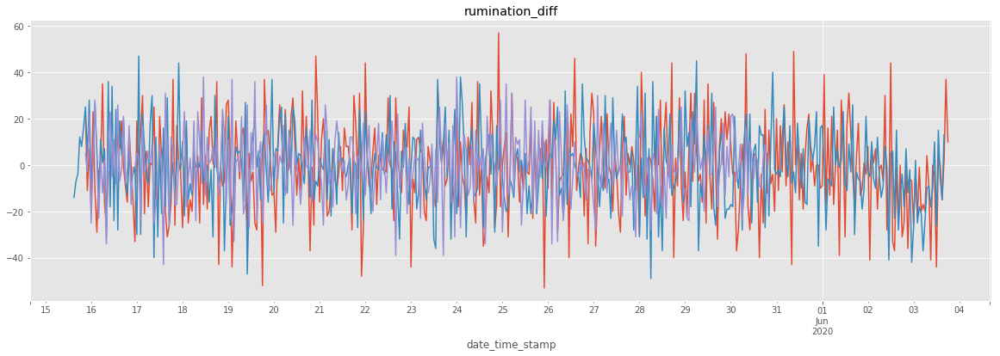

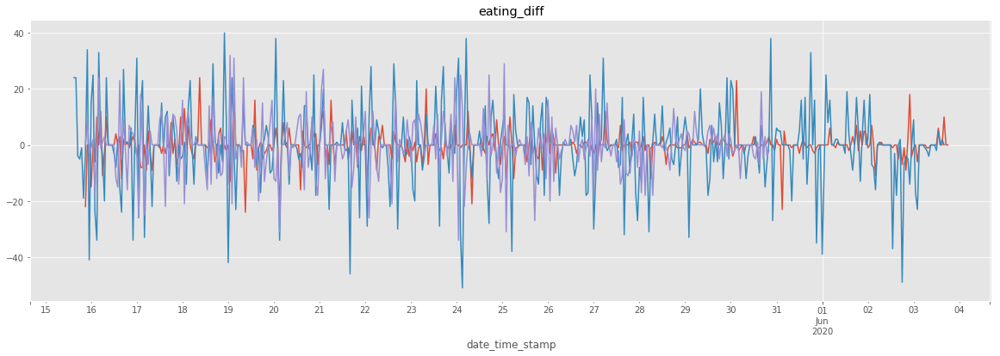

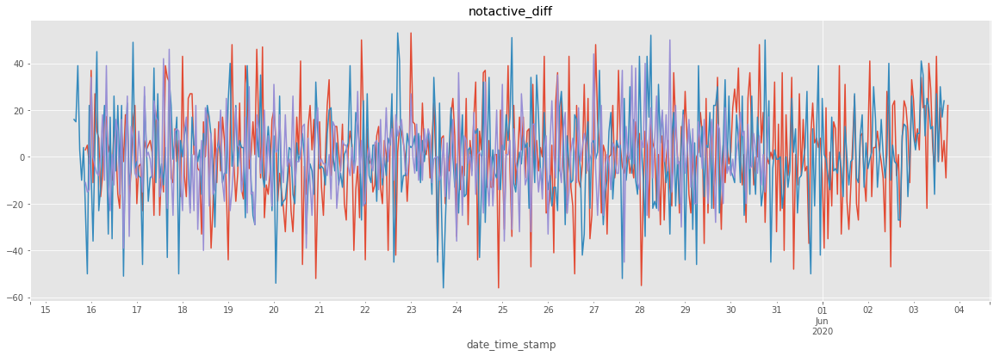

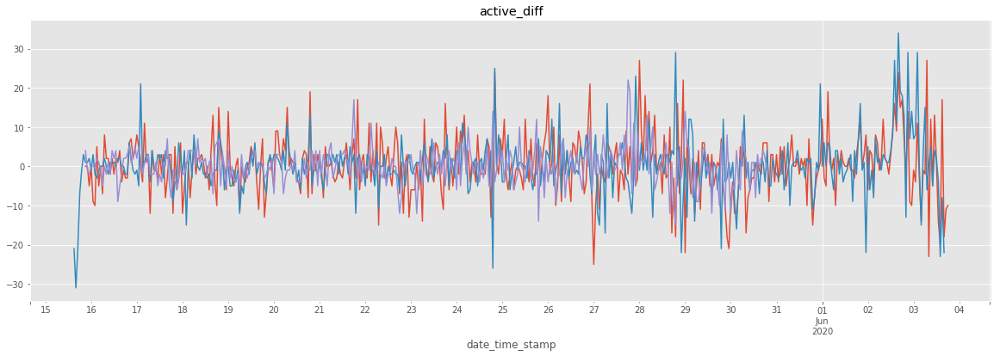

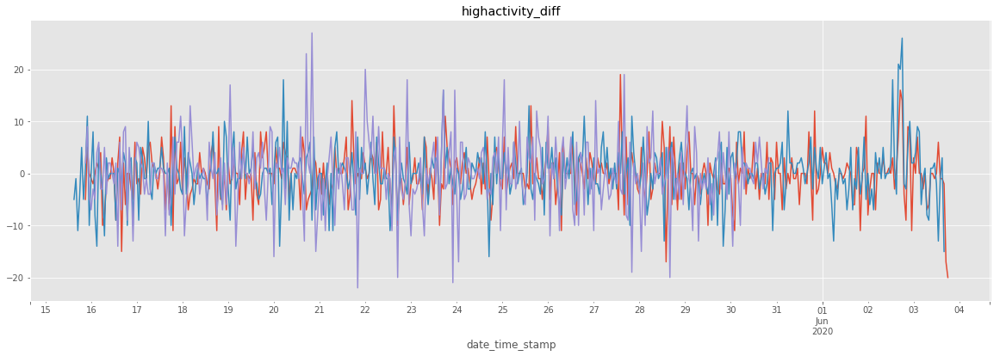

...

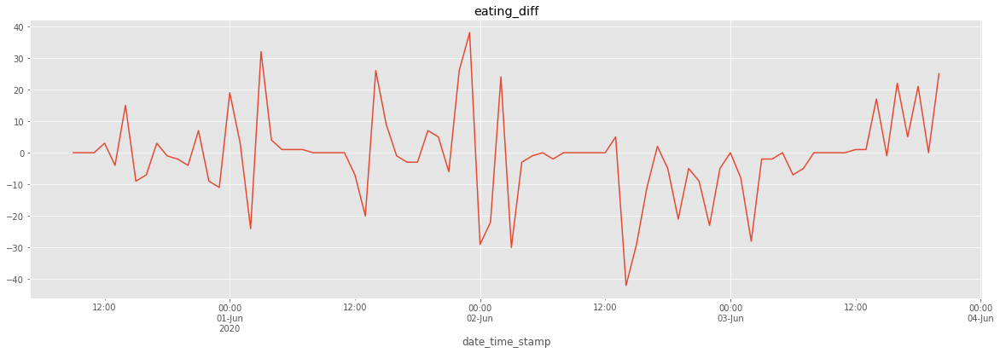

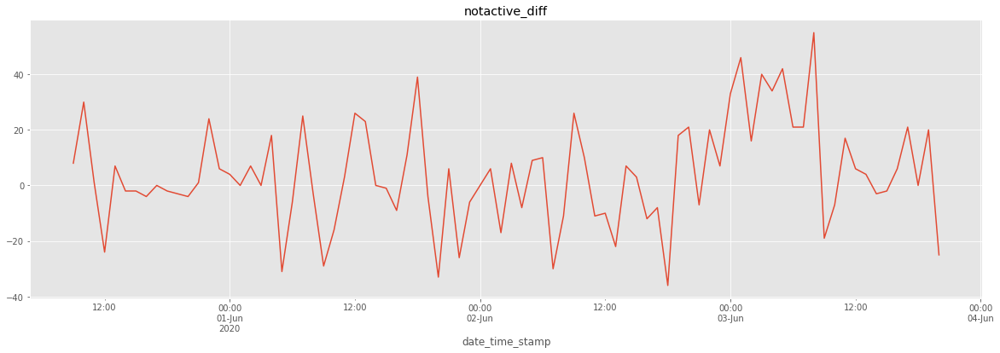

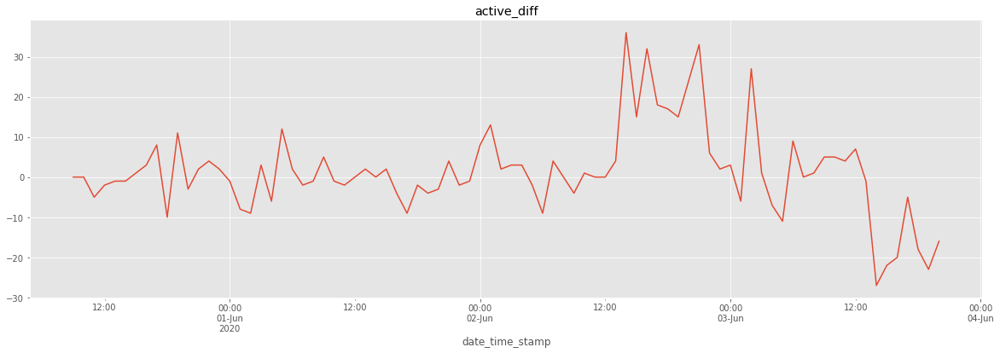

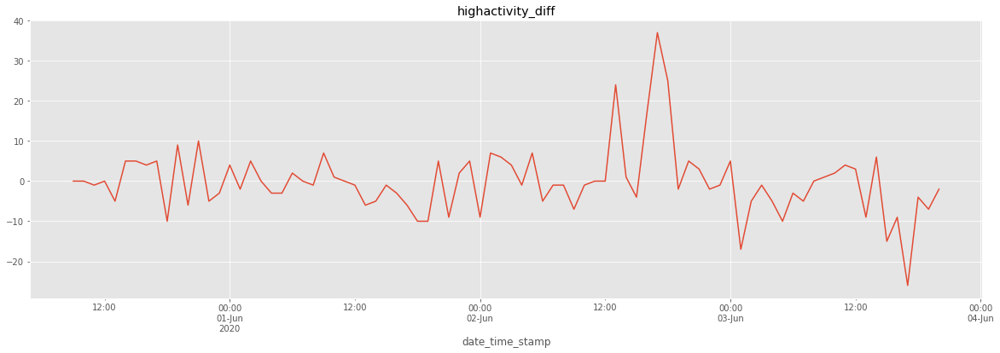

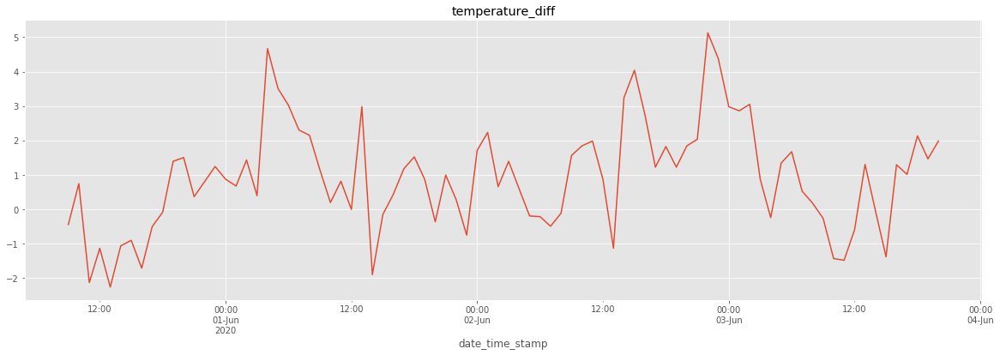

In [9]:
n = 1344 # chunk row size (1 day * 14 days = 336 rows are for 1 cow). If n = 1344, then I am looking at 4 cows per plot
list_df = [df[i:i+n] for i in range(0, df.shape[0], n)]
#[i.shape for i in list_df]

variables = ('rumination_diff', 'eating_diff', 'notactive_diff', 'active_diff', 'highactivity_diff', 'temperature_diff')

for i in list_df:
    for ii in variables:
        df_rum = i.groupby('cow_id')
        df_rum[ii].plot(title = ii, figsize = (20, 6))
        plt.show()
    plt.show()

<br><br>
## Resample - Time Aggregations

<br>
### 6 Hours starting @ 13:00 hrs (resample base = 13)

In [158]:
df['cow_id'].head(3)

datetime_stamp
2020-05-14 21:00:00    172
2020-05-14 22:00:00    172
2020-05-14 23:00:00    172
Name: cow_id, dtype: int64

In [161]:
#df.loc[(df['scc_catg'].notnull())][['cow_id','scc_catg','rumination_diff']]

In [163]:
sensor_vars = ['rumination_diff', 'eating_diff', 'notactive_diff', 'active_diff', 'highactivity_diff', 'temperature_diff']

for i in sensor_vars:
    df_resample6Hmean = df.groupby('cow_id')[sensor_vars].resample('6H', base = 20).mean().fillna('missing')
    df_resample6Hmean.reset_index(inplace = True)

# The dry-off is at 13 hours, but since the index is in UTC timezone, I will change the base to 20,
# once it is transformed into PCT timezone, it will be correctly positioned at 13 hours.
    
df_resample6Hmean.columns = ['cow_id', 'datetime_stamp', 
                             'rumination_diff_6Hmean', 
                             'eating_diff_6Hmean', 
                             'notactive_diff_6Hmean', 
                             'active_diff_6Hmean', 
                             'highactivity_diff_6Hmean',
                             'temperature_diff_6Hmean']


# I have now two data frames: the one with the original data, and the one with the resample data
# The original data, has an index of the timestamp form and I will need a multi-index
# Make sure both have same multi-index before merging
df_resample6Hmean = df_resample6Hmean.set_index(['cow_id', 'datetime_stamp'])

In [164]:
sensor_vars = ['rumination_diff', 'eating_diff', 'notactive_diff', 'active_diff', 'highactivity_diff', 'temperature_diff']

for i in sensor_vars:
    df_resample6Hsum = df.groupby('cow_id')[sensor_vars].resample('6H', base = 20).sum().fillna('missing')
    df_resample6Hsum.reset_index(inplace = True)
    
# The dry-off is at 13 hours, but since the index is in UTC timezone, I will change the base to 20,
# once it is transformed into PCT timezone, it will be correctly positioned at 13 hours.
 
    
df_resample6Hsum.columns = ['cow_id', 'datetime_stamp', 
                             'rumination_diff_6Hsum', 
                             'eating_diff_6Hsum', 
                             'notactive_diff_6Hsum', 
                             'active_diff_6Hsum', 
                             'highactivity_diff_6Hsum',
                             'temperature_diff_6Hsum']


# I have now two data frames: the one with the original data, and the one with the resample data
# The original data, has an index of the timestamp form and I will need a multi-index
# Make sure both have same multi-index before merging
df_resample6Hsum = df_resample6Hsum.set_index(['cow_id', 'datetime_stamp'])

In [165]:
sensor_vars = ['rumination_diff', 'eating_diff', 'notactive_diff', 'active_diff', 'highactivity_diff', 'temperature_diff']

for i in sensor_vars:
    df_resample6Hvar = df.groupby('cow_id')[sensor_vars].resample('6H', base = 20).var().fillna('missing')
    df_resample6Hvar.reset_index(inplace = True)
    
# The dry-off is at 13 hours, but since the index is in UTC timezone, I will change the base to 20,
# once it is transformed into PCT timezone, it will be correctly positioned at 13 hours.
 
    
df_resample6Hvar.columns = ['cow_id', 'datetime_stamp', 
                             'rumination_diff_6Hvar', 
                             'eating_diff_6Hvar', 
                             'notactive_diff_6Hvar', 
                             'active_diff_6Hvar', 
                             'highactivity_diff_6Hvar',
                             'temperature_diff_6Hvar']


# I have now two data frames: the one with the original data, and the one with the resample data
# The original data, has an index of the timestamp form and I will need a multi-index
# Make sure both have same multi-index before merging
df_resample6Hvar = df_resample6Hvar.set_index(['cow_id', 'datetime_stamp'])

In [167]:
# Merging dataframes (concatenate is changing results)
df_6Hmeanvar = pd.merge(df_resample6Hmean, df_resample6Hvar, left_index=True, right_index=True, how='outer', validate = 'one_to_one')
df_6Hmeanvarsum = pd.merge(df_6Hmeanvar, df_resample6Hsum, left_index=True, right_index=True, how='outer', validate = 'one_to_one')


In [169]:
df_6Hmeanvarsum.head(10)

rumination_diff_6Hmean eating_diff_6Hmean  \
cow_id datetime_stamp                                                  
172    2020-05-14 20:00:00                missing            missing   
       2020-05-15 02:00:00                missing            missing   
       2020-05-15 08:00:00                missing            missing   
       2020-05-15 14:00:00                missing            missing   
       2020-05-15 20:00:00                    4.2               -7.4   
       2020-05-16 02:00:00               -3.66667           0.333333   
       2020-05-16 08:00:00                     -7            2.33333   
       2020-05-16 14:00:00                2.16667                 -1   
       2020-05-16 20:00:00               -2.66667                  0   
       2020-05-17 02:00:00                      2           -3.83333   

                           notactive_diff_6Hmean active_diff_6Hmean  \
cow_id datetime_stamp                                                 
172    2020-05-14 20:00:00               missing            missing   
       2020-05-15 02:00:00               missing            missing   
       2020-05-15 08:00:00               missing            missing   
       2020-05-15 14:00:00               missing            missing   
       2020-05-15 20:00:00                   6.2               -2.8   
       2020-05-16 02:00:00                   6.5               -1.5   
       2020-05-16 08:00:00                   5.5           0.666667   
       2020-05-16 14:00:00               1.16667                 -1   
       2020-05-16 20:00:00              -1.66667            5.33333   
       2020-05-17 02:00:00             -0.666667          -0.333333   

                           highactivity_diff_6Hmean temperature_diff_6Hmean  \
cow_id datetime_stamp                                                         
172    2020-05-14 20:00:00                  missing                 missing   
       2020-05-15 02:00:00                  missing                 missing   
       2020-05-15 08:00:00                  missing                 missing   
       2020-05-15 14:00:00                  missing                 missing   
       2020-05-15 20:00:00                     -0.6                   2.002   
       2020-05-16 02:00:00                 -1.83333                    0.59   
       2020-05-16 08:00:00                 -1.66667                   1.335   
       2020-05-16 14:00:00                 -1.66667                 1.44667   
       2020-05-16 20:00:00                -0.833333                   2.825   
       2020-05-17 02:00:00                  2.33333               -0.461667   

                           rumination_diff_6Hvar eating_diff_6Hvar  \
cow_id datetime_stamp                                                
172    2020-05-14 20:00:00               missing           missing   
       2020-05-15 02:00:00               missing           missing   
       2020-05-15 08:00:00               missing           missing   
       2020-05-15 14:00:00               missing           missing   
       2020-05-15 20:00:00                 395.2             108.8   
       2020-05-16 02:00:00               475.067           81.8667   
       2020-05-16 08:00:00                 121.6           16.6667   
       2020-05-16 14:00:00               177.767              30.4   
       2020-05-16 20:00:00               371.867               5.6   
       2020-05-17 02:00:00                 374.8           30.9667   

                           notactive_diff_6Hvar active_diff_6Hvar  \
cow_id datetime_stamp                                               
172    2020-05-14 20:00:00              missing           missing   
       2020-05-15 02:00:00              missing           missing   
       2020-05-15 08:00:00              missing           missing   
       2020-05-15 14:00:00              missing           missing   
       2020-05-15 20:00:00                335.2              16.7   
       2020-05-16 02:00:00          

<br>
### 12 Hours starting @ 13:00 hrs (resample base = 13)

In [170]:
sensor_vars = ['rumination_diff', 'eating_diff', 'notactive_diff', 'active_diff', 'highactivity_diff', 'temperature_diff']

for i in sensor_vars:
    df_resample12Hmean = df.groupby('cow_id')[sensor_vars].resample('12H', base = 20).mean().fillna('missing')
    df_resample12Hmean.reset_index(inplace = True)

# The dry-off is at 13 hours, but since the index is in UTC timezone, I will change the base to 20,
# once it is transformed into PCT timezone, it will be correctly positioned at 13 hours.    

df_resample12Hmean.columns = ['cow_id', 'datetime_stamp', 
                              'rumination_diff_12Hmean', 
                              'eating_diff_12Hmean', 
                              'notactive_diff_12Hmean', 
                              'active_diff_12Hmean', 
                              'highactivity_diff_12Hmean',
                              'temperature_diff_12Hmean']


# I have now two data frames: the one with the original data, and the one with the resample data
# The original data, has an index of the timestamp form and I will need a multi-index
# Make sure both have same multi-index before merging
df_resample12Hmean = df_resample12Hmean.set_index(['cow_id', 'datetime_stamp'])

In [171]:
sensor_vars = ['rumination_diff', 'eating_diff', 'notactive_diff', 'active_diff', 'highactivity_diff', 'temperature_diff']

for i in sensor_vars:
    df_resample12Hsum = df.groupby('cow_id')[sensor_vars].resample('12H', base = 20).sum().fillna('missing')
    df_resample12Hsum.reset_index(inplace = True)
    
# The dry-off is at 13 hours, but since the index is in UTC timezone, I will change the base to 20,
# once it is transformed into PCT timezone, it will be correctly positioned at 13 hours.
    
df_resample12Hsum.columns = ['cow_id', 'datetime_stamp', 
                              'rumination_diff_12Hsum', 
                              'eating_diff_12Hsum', 
                              'notactive_diff_12Hsum', 
                              'active_diff_12Hsum', 
                              'highactivity_diff_12Hsum',
                              'temperature_diff_12Hsum']


# I have now two data frames: the one with the original data, and the one with the resample data
# The original data, has an index of the timestamp form and I will need a multi-index
# Make sure both have same multi-index before merging
df_resample12Hsum = df_resample12Hsum.set_index(['cow_id', 'datetime_stamp'])

In [172]:
sensor_vars = ['rumination_diff', 'eating_diff', 'notactive_diff', 'active_diff', 'highactivity_diff', 'temperature_diff']

for i in sensor_vars:
    df_resample12Hvar = df.groupby('cow_id')[sensor_vars].resample('12H', base = 20).var().fillna('missing')
    df_resample12Hvar.reset_index(inplace = True)
    
# The dry-off is at 13 hours, but since the index is in UTC timezone, I will change the base to 20,
# once it is transformed into PCT timezone, it will be correctly positioned at 13 hours.
    
df_resample12Hvar.columns = ['cow_id', 'datetime_stamp', 
                              'rumination_diff_12Hvar', 
                              'eating_diff_12Hvar', 
                              'notactive_diff_12Hvar', 
                              'active_diff_12Hvar', 
                              'highactivity_diff_12Hvar',
                              'temperature_diff_12Hvar']


# I have now two data frames: the one with the original data, and the one with the resample data
# The original data, has an index of the timestamp form and I will need a multi-index
# Make sure both have same multi-index before merging
df_resample12Hvar = df_resample12Hvar.set_index(['cow_id', 'datetime_stamp'])

In [173]:
# Merging dataframes (concatenate is changing results)
df_12Hmeanvar = pd.merge(df_resample12Hmean, df_resample12Hvar, left_index=True, right_index=True, how='outer', validate = 'one_to_one')
df_12Hmeanvarsum = pd.merge(df_12Hmeanvar, df_resample12Hsum, left_index=True, right_index=True, how='outer', validate = 'one_to_one')


In [174]:
df_12Hmeanvarsum.head(10)

rumination_diff_12Hmean eating_diff_12Hmean  \
cow_id datetime_stamp                                                    
172    2020-05-14 20:00:00                 missing             missing   
       2020-05-15 08:00:00                 missing             missing   
       2020-05-15 20:00:00              -0.0909091            -3.18182   
       2020-05-16 08:00:00                -2.41667            0.666667   
       2020-05-16 20:00:00               -0.333333            -1.91667   
       2020-05-17 08:00:00                -2.41667           -0.916667   
       2020-05-17 20:00:00                      -7             1.33333   
       2020-05-18 08:00:00                0.416667             2.41667   
       2020-05-18 20:00:00                 1.58333                0.25   
       2020-05-19 08:00:00                -7.16667            -2.66667   

                           notactive_diff_12Hmean active_diff_12Hmean  \
cow_id datetime_stamp                                                   
172    2020-05-14 20:00:00                missing             missing   
       2020-05-15 08:00:00                missing             missing   
       2020-05-15 20:00:00                6.36364            -2.09091   
       2020-05-16 08:00:00                3.33333           -0.166667   
       2020-05-16 20:00:00               -1.16667                 2.5   
       2020-05-17 08:00:00                4.58333            -1.16667   
       2020-05-17 20:00:00                8.41667            -1.58333   
       2020-05-18 08:00:00                  -4.75             1.41667   
       2020-05-18 20:00:00              -0.166667           -0.416667   
       2020-05-19 08:00:00                  11.25               -1.25   

                           highactivity_diff_12Hmean temperature_diff_12Hmean  \
cow_id datetime_stamp                                                           
172    2020-05-14 20:00:00                   missing                  missing   
       2020-05-15 08:00:00                   missing                  missing   
       2020-05-15 20:00:00                  -1.27273                  1.23182   
       2020-05-16 08:00:00                  -1.66667                  1.39083   
       2020-05-16 20:00:00                      0.75                  1.18167   
       2020-05-17 08:00:00                 -0.166667                    -0.28   
       2020-05-17 20:00:00                      -0.5                 -1.71083   
       2020-05-18 08:00:00                  0.333333                -0.791667   
       2020-05-18 20:00:00                  -1.41667                 -1.00083   
       2020-05-19 08:00:00                      0.25                  -1.2275   

                           rumination_diff_12Hvar eating_diff_12Hvar  \
cow_id datetime_stamp                                                  
172    2020-05-14 20:00:00                missing            missing   
       2020-05-15 08:00:00                missing            missing   
       2020-05-15 20:00:00                412.491            100.764   
       2020-05-16 08:00:00                158.992            24.4242   
       2020-05-16 20:00:00                345.333            20.6288   
       2020-05-17 08:00:00                471.174            14.8106   
       2020-05-17 20:00:00                242.364            36.0606   
       2020-05-18 08:00:00                 541.72            59.1742   
       2020-05-18 20:00:00                387.902            46.3864   
       2020-05-19 08:00:00                553.424            81.1515   

                           notactive_diff_12Hvar active_diff_12Hvar  \
cow_id datetime_stamp                                                 
172    2020-05-14 20:00:00               missing            missing   
       2020-05-15 08:00:00               missing            missing   
       2020-05-15 20:00:00               267.855            32.0909   
       2020-05-16 08:00:00               182.061            6.87879 

In [175]:
print df_6Hmeanvarsum.shape
print df_12Hmeanvarsum.shape

(8123, 18)
(4115, 18)


In [176]:
df_6H12H = pd.merge(df_6Hmeanvarsum, df_12Hmeanvarsum, left_index=True, right_index=True, how='outer', validate = 'one_to_one')

#print (df_6H12H.iloc[0:5, 15:20]).head(5)
print df_6H12H.shape

(8127, 36)


<br>
### Merge resampled dataframe with original (sorted and complete) dataframe
<br>

In [177]:
print df.head(3)
print df_6H12H.head(3)

print df.shape
print df_6H12H.shape

                     Unnamed: 0  cow_id  Unnamed: 0_x  Active  Eating  \
datetime_stamp                                                          
2020-05-14 21:00:00           0     172           0.0     1.0    31.0   
2020-05-14 22:00:00           1     172           1.0     3.0     0.0   
2020-05-14 23:00:00           2     172           2.0     9.0     0.0   

                     HighActive  MeasurementCount  NotActive  Ruminating  \
datetime_stamp                                                             
2020-05-14 21:00:00        14.0              60.0       13.0         1.0   
2020-05-14 22:00:00         1.0              60.0       23.0        33.0   
2020-05-14 23:00:00         0.0              60.0       17.0        34.0   

                     Temperature       ...        hour_PCT  \
datetime_stamp                         ...                   
2020-05-14 21:00:00        24.34       ...             NaN   
2020-05-14 22:00:00        27.86       ...             NaN   
2020-

In [178]:
# Make sure both df have the same index
df.reset_index(inplace = True)
df.set_index(['cow_id', 'datetime_stamp'], inplace = True)
df.head(5)

Unnamed: 0  Unnamed: 0_x  Active  Eating  \
cow_id datetime_stamp                                                  
172    2020-05-14 21:00:00           0           0.0     1.0    31.0   
       2020-05-14 22:00:00           1           1.0     3.0     0.0   
       2020-05-14 23:00:00           2           2.0     9.0     0.0   
       2020-05-15 00:00:00           3           3.0     4.0    19.0   
       2020-05-15 01:00:00           4           4.0    12.0     0.0   

                            HighActive  MeasurementCount  NotActive  \
cow_id datetime_stamp                                                 
172    2020-05-14 21:00:00        14.0              60.0       13.0   
       2020-05-14 22:00:00         1.0              60.0       23.0   
       2020-05-14 23:00:00         0.0              60.0       17.0   
       2020-05-15 00:00:00         7.0              59.0        0.0   
       2020-05-15 01:00:00         3.0              59.0       32.0   

                            Ruminating  Temperature          TimeStamp  \
cow_id datetime_stamp                                                    
172    2020-05-14 21:00:00         1.0        24.34  20200514 21:00:00   
       2020-05-14 22:00:00        33.0        27.86  20200514 22:00:00   
       2020-05-14 23:00:00        34.0        29.86  20200514 23:00:00   
       2020-05-15 00:00:00        29.0        30.53  20200515 00:00:00   
       2020-05-15 01:00:00        12.0        31.33  20200515 01:00:00   

                                  ...         hour_PCT  date_time_stamp_PCT  \
cow_id datetime_stamp             ...                                         
172    2020-05-14 21:00:00        ...              NaN                  NaN   
       2020-05-14 22:00:00        ...              NaN                  NaN   
       2020-05-14 23:00:00        ...              NaN                  NaN   
       2020-05-15 00:00:00        ...              NaN                  NaN   
       2020-05-15 01:00:00        ...              NaN                  NaN   

                           date_cowdata_PCT     _merge  rumination_diff  \
cow_id datetime_stamp                                                     
172    2020-05-14 21:00:00              NaN  left_only              NaN   
       2020-05-14 22:00:00              NaN  left_only              NaN   
       2020-05-14 23:00:00              NaN  left_only              NaN   
       2020-05-15 00:00:00              NaN  left_only              NaN   
       2020-05-15 01:00:00              NaN  left_only              NaN   

                            eating_diff  notactive_diff  active_diff  \
cow_id datetime_stamp                                                  
172    2020-05-14 21:00:00          NaN             NaN          NaN   
       2020-05-14 22:00:00          NaN             NaN          NaN   
       2020-05-14 23:00:00          NaN             NaN          NaN   
       2020-05-15 00:00:00          NaN             NaN          NaN   
       2020-05-15 01:00:00          NaN             NaN          NaN   

                           highactivity_diff  temperature_diff  
cow_id datetime_stamp                                           
172    2020-05-14 21:00:00               NaN               NaN  
       2020-05-14 22:00:00               NaN               NaN  
       2020-05-14 23:00:00               NaN               NaN  
       2020-05-15 00:00:00               NaN               NaN  
       2020-05-15 01:00:00               NaN               NaN  

[5 rows x 74 columns]

In [179]:
df_merged = pd.merge(df, df_6H12H, left_index=True, right_index=True, how='outer', validate = 'one_to_one')


In [181]:
print df_merged.shape

(47614, 110)


In [182]:
df_merged.reset_index(inplace = True)
df_merged.head(3)

,cow_id,datetime_stamp,Unnamed: 0,Unnamed: 0_x,Active,Eating,HighActive,MeasurementCount,NotActive,Ruminating,...,notactive_diff_12Hvar,active_diff_12Hvar,highactivity_diff_12Hvar,temperature_diff_12Hvar,rumination_diff_12Hsum,eating_diff_12Hsum,notactive_diff_12Hsum,active_diff_12Hsum,highactivity_diff_12Hsum,temperature_diff_12Hsum
0,172,2020-05-14 20:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,missing,missing,missing,missing,0.0,0.0,0.0,0.0,0.0,0.0
1,172,2020-05-14 21:00:00,0.0,0.0,1.0,31.0,14.0,60.0,13.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,172,2020-05-14 22:00:00,1.0,1.0,3.0,0.0,1.0,60.0,23.0,33.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<br>
Do not change to UTC timezone because it will loose it when saving the data and reading it again later.
<br><br>

In [183]:
df_merged.to_csv("/Users/gemavidal/Box Sync/Vet/Projects and Papers/2021 Chapter 4 Dissertation High SCC Prediciton Udder Hygiene/df_sensor_cow_completedates_mergedclinicaldata_6H12Haggreg_August2020.csv")


<br><br>
What I have up to this point is a dataframe with one row per hour and day and cow, with all the raw sensor data, the aggregated sensor data every 6 and 12 hours, and the clinical data already assigned at 20:00:00 UTC timezone. I am also keeping track of dates and hours in PCT timezone.
<br><br>

In [184]:
df_merged[['cow_id','datetime_stamp','date_time_stamp_PCT','date_time_stamp']].head(10)

,cow_id,datetime_stamp,date_time_stamp_PCT,date_time_stamp
0,172,2020-05-14 20:00:00,NaN,NaN
1,172,2020-05-14 21:00:00,NaN,2020-05-14 21:00:00
2,172,2020-05-14 22:00:00,NaN,2020-05-14 22:00:00
3,172,2020-05-14 23:00:00,NaN,2020-05-14 23:00:00
4,172,2020-05-15 00:00:00,NaN,2020-05-15 00:00:00
5,172,2020-05-15 01:00:00,NaN,2020-05-15 01:00:00
6,172,2020-05-15 02:00:00,NaN,2020-05-15 02:00:00
7,172,2020-05-15 03:00:00,NaN,2020-05-15 03:00:00
8,172,2020-05-15 04:00:00,NaN,2020-05-15 04:00:00
9,172,2020-05-15 05:00:00,NaN,2020-05-15 05:00:00


In [190]:
df_merged.dtypes

cow_id                                int64
datetime_stamp               datetime64[ns]
Unnamed: 0                          float64
Unnamed: 0_x                        float64
Active                              float64
Eating                              float64
HighActive                          float64
MeasurementCount                    float64
NotActive                           float64
Ruminating                          float64
Temperature                         float64
TimeStamp                            object
Unnamed: 0.1_x                      float64
Unnamed: 0.1.1_x                    float64
date_time_stamp                      object
index                               float64
sensor_day                          float64
sensor_day_PCT                      float64
sensor_hour                         float64
sensor_hour_PCT                     float64
date_sensordata_PCT                  object
Unnamed: 0_y                        float64
DIM at dry-off                  

<br>
### Refill the clinical data

## DO NOT NEED TO RUN THIS PART:
### CLINICAL DATA HAS BEEN ALREADY ASSIGNED AT 13:00:00 PCT / 20:00:00 UTC
<br><br>

In [185]:
#df_merged[['date_time_stamp','sensor_day','date_time_stamp','sensor_day_PCT']].head(5)

In [90]:
# Get the date again, since new time stamps have been created
#df_merged['sensor_day_PCT'] = df_merged['datetime_stamp'].dt.day

#print df_merged['sensor_day_PCT'].isna().sum()

#df_merged.loc[(df_merged['datetime_stamp'].isnull())][['date_time_stamp','sensor_hour']]

<br>
The 4 rows I got without data are for the following cows and dates: 7274 (02-June), 4518 (02-June), 5406 (30-June), 4059 (04-August)<br>

In [186]:
#df_merged.shape
#df_merged_i = df_merged.loc[~(df_merged['datetime_stamp'].isnull())]
#df_merged_i.shape

I've decided that, for now, I will just remove those rows from the dataframe

<br><br>
For the next part, fist choose all the cow-level variables that we are going to need at the time when dry-off occurs, which is 13 using Pacific Timezone, so that is why I will be using 'sensor_day_PCT' to choose the dry-off hour.
<br><br>
Then, I will fill all the hours with the data using .ffill()
<br><br>
After that, I will change all those observations that do not belong to the 13 hours, PCT, with NaN.<br><br>

In [133]:
#df_merged_i.loc[(df_merged_i['scc_catg'].notnull())][['date_time_stamp_PCT_sensor','cow_id','date_PCT','sensor_hour_PCT','scc_catg']]
#df_merged_i.loc[(df_merged_i['sensor_hour_PCT'] == 13)][['date_time_stamp_PCT_sensor','cow_id','sensor_hour_PCT','hygiene_score','rumination_diff_6Hmean']].head(35)
#df_merged_i['cow_id'].value_counts()

In [118]:
# First, fill in all the missing values for a given cow and day since some of the clinical data may be in rows
# before the 13:00 hrs

variables = ['scc_catg','hygiene_score','hygiene_score_notes','recorder','notes','scc_sample_id',
             'labdate_stamp','dryoff_date', 
             'stall_number','Order','Sample ID','Stall ID', 
             'Fat','Pro','Lac','Snf','Mun','Scc','Last test-day milk production (lbs)',
             'Lactation number','parity_catg','diff_dryoff_lastCM','No_CM_catg',
             'N clinical mastitis current lactation','N days for 1st CM case', 
             'N days from last CM to dry-off',
             'Fresh date','freshdate_stamp','Last move','lastmovedate_stamp',
             'Pen', 'season','month','last Pen','diff_penmovement',
             'Day first CM','dayfirstCM_stamp','Last CM','daylastCM_stamp']

for i in variables:
    df_merged_i[i] = df_merged_i.groupby(['cow_id', 'sensor_day_PCT'])[i].ffill()

    
# removing observations in those hours where diagnostic does not happen
for i in variables:
    df_merged_i.loc[~(df_merged_i.sensor_hour_PCT == 13), [i]] = np.nan

    
# Re-filling metricheck up to 24 hours after diagnostic
# I can do it this way ONLY because none of the cows were checked two days in a row
#for i in variables:
#    df[i] = df[i].ffill(limit = 23)

/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


<br>
## DIM for each row (RUN THIS PART)
### I need to include DIM for each cow, for each row (so I can compute later descriptives of each behavior by DIM)

Fill the variables 'DIM at dry-off', 'dryoffdate_stamp' in each row within cow_id ('date' is already filled)

In [188]:
variables_forward = ['dryoffdate_stamp']

for i in variables_forward:
    df_merged[i] = df_merged.groupby(['cow_id'])[i].ffill()



variables_backward = ['DIM at dry-off', 'dryoffdate_stamp']

for i in variables_backward:
    df_merged[i] = df_merged.groupby(['cow_id'])[i].bfill()


<br>
Calculate the difference using the dates. Make sure the dates are a datetimestamp type

In [192]:
df_merged[['cow_id','datetime_stamp','sensor_day','sensor_day_PCT',
           'sensor_hour','sensor_hour_PCT','date_sensordata_PCT',
           'dryoffdate_stamp','DIM at dry-off']].head(5)

,cow_id,datetime_stamp,sensor_day,sensor_day_PCT,sensor_hour,sensor_hour_PCT,date_sensordata_PCT,dryoffdate_stamp,DIM at dry-off
0,172,2020-05-14 20:00:00,NaN,NaN,NaN,NaN,NaN,2020-06-02,303.0
1,172,2020-05-14 21:00:00,14.0,14.0,21.0,14.0,2020-05-14,2020-06-02,303.0
2,172,2020-05-14 22:00:00,14.0,14.0,22.0,15.0,2020-05-14,2020-06-02,303.0
3,172,2020-05-14 23:00:00,14.0,14.0,23.0,16.0,2020-05-14,2020-06-02,303.0
4,172,2020-05-15 00:00:00,15.0,14.0,0.0,17.0,2020-05-14,2020-06-02,303.0


In [194]:
df_merged['date_sensordata_PCT'] = pd.to_datetime(df_merged['date_sensordata_PCT'], format = '%Y-%m-%d')
df_merged['dryoffdate_stamp'] = pd.to_datetime(df_merged['dryoffdate_stamp'], format = '%Y-%m-%d')

In [195]:
df_merged[['date_sensordata_PCT', 'dryoffdate_stamp', 'DIM at dry-off']].dtypes

date_sensordata_PCT    datetime64[ns]
dryoffdate_stamp       datetime64[ns]
DIM at dry-off                float64
dtype: object

In [197]:
# Generate the new column.
# I don't need to do this grouping by cow because the dry-off dates and DIM at dry-off where already for each cow
# This is just a matter of calculating the difference between columns.

df_merged['DIM'] = df_merged['DIM at dry-off'] - (df_merged['dryoffdate_stamp'] - df_merged['date_sensordata_PCT']).dt.days

In [199]:
# Save dataframe
df_merged.to_csv("/Users/gemavidal/Box Sync/Vet/Projects and Papers/2021 Chapter 4 Dissertation High SCC Prediciton Udder Hygiene/df_sensor_cow_completedates_mergedclinicaldata_6H12Haggreg_August2020.csv")


<br><br>
## Encoding the time of the day

In [ ]:
# Read in the file
file_path = "/Users/gemavidal/Box Sync/Vet/Projects and Papers/2021 Chapter 4 Dissertation High SCC Prediciton Udder Hygiene/df_sensor_cow_completedates_mergedclinicaldata_6H12Haggreg.csv"
df = pd.read_csv(file_path)

In [ ]:
# create categorical variable. The variable 'hour' already exists in the dataframe
def label_timeofday (row):
    if (row['hour'] >= 4 and row['hour'] < 6):
        return 'milking_am'
    if (row['hour'] >= 6 and row['hour'] < 15):
        return 'morning_afternoon'
    if (row['hour'] >= 15 and row['hour'] < 17):
        return 'milking_pm'
    if (row['hour'] >= 17):
        return 'evening_night'
    if (row['hour'] < 4):
        return 'evening_night'
    return 'NaN'

In [ ]:
df['time_catg'] = df.apply(lambda row: label_timeofday(row), axis = 1)

In [ ]:
# Save the file